# Initial Conditions Optimization
## Plot History

In [4]:
%matplotlib inline
import matplotlib
matplotlib.font_manager._rebuild()
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as style
style.use('fivethirtyeight')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pandas as pd
import numpy as np
from datetime import datetime,timedelta
import io
import os
from IPython.display import display, HTML, Markdown
from datetime import date
from datetime import datetime

## Load PlayFair Display and Roboto Fonts from Google

In [5]:
from tempfile import NamedTemporaryFile
import urllib.request
import matplotlib.font_manager as fm

github_url = 'https://github.com/google/fonts/raw/master/ofl/playfairdisplay/static/PlayfairDisplay-Regular.ttf'
url = github_url  # You want the actual file, not some html

user_agent = 'Mozilla/5.0 (Windows NT 6.1; Win64; x64)'
headers = {'User-Agent': user_agent}

request = urllib.request.Request(url,headers=headers)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()

heading_font = fm.FontProperties(fname=f.name, size=28)

github_url = 'https://github.com/google/fonts/raw/master/apache/roboto/static/Roboto-Regular.ttf'
url = github_url  # You want the actual file, not some html

request = urllib.request.Request(url,headers=headers)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
subtitle_font = fm.FontProperties(fname=f.name, size=20)


## Load Humor Sans Font

In [6]:
# github_url = 'http://antiyawn.com/uploads/Humor-Sans-1.0.ttf'
# github_url = 'https://github.com/ipython/xkcd-font/blob/master/xkcd-script/font/xkcd-script.ttf'
github_url = 'https://github.com/ipython/xkcd-font/raw/master/xkcd/build/xkcd-Regular.otf'
# github_url = 'https://github.com/shreyankg/xkcd-desktop/blob/master/Humor-Sans.ttf'
url = github_url  # You want the actual file, not some html

request = urllib.request.Request(url,headers=headers)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
comic_font = fm.FontProperties(fname=f.name, size=18)

# Main code

In [7]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return false;}

<IPython.core.display.Javascript object>

## Load Initial Parameters

In [8]:
dfparam = pd.read_csv("data/param.csv")
display(dfparam)


,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,WCASES,WREC,WDTH
0,Brazil,3/2/20,200,10000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
1,China,1/28/20,200,50000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
2,Italy,2/28/20,200,2000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
3,US,2/20/20,200,20000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8
4,India,3/10/20,200,10000000.0,0.0001,0.0001,200,100,50,50,0.15,0.05,0.8


## Select data set

In [9]:
opt=5

#select history file version, model and states
model="Yabox"
countries=dfparam.country

if opt==0:
    version="003"

if opt==1:
    version="004"

if opt==2:
    version="005"

if opt==3:
    version="006"

if opt==4:
    version="007"   

if opt==5:
    version="008" 

In [10]:
strFile="results/IC_optimizedCountries"+version+".csv"
if os.path.isfile(strFile):
    os.remove(strFile)

## Plot Parameters Function

In [11]:
def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)

def plotParams(country,model,histMin,paramList,paramListNames,version):
    
    #prepare plotting
    color_bg = '#FEF1E5'
    lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC' 

    histShow=histMin.nsmallest(20, ['gtot']).sort_values('gtot',ignore_index=True,ascending=False)

    with plt.xkcd():

        fig, host = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        fig.subplots_adjust(right=0.75)
        host.patch.set_facecolor(darker_highlight)

        plt.rc('font', size=16)        

        #fonts for the thicks
        for label in (host.get_xticklabels() + host.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop

        par1 = host.twinx()
        par2 = host.twinx()
        par3 = host.twinx()

        # Offset the right spine of par2.  The ticks and label have already been
        # placed on the right by twinx above.
        par2.spines["right"].set_position(("axes", 1.1))
        par3.spines["right"].set_position(("axes", 1.2))


        # Having been created by twinx, par2 has its frame off, so the line of its
        # detached spine is invisible.  First, activate the frame but make the patch
        # and spines invisible.
        make_patch_spines_invisible(par2)
        make_patch_spines_invisible(par1)
        make_patch_spines_invisible(par3)

        # Second, show the right spine.
        par2.spines["right"].set_visible(True)
        par2.spines["right"].set_color("white")
        par2.spines["right"].set_linewidth(2)  
        par2.spines["right"].set_linestyle((0,(3,3)))   
        par2.spines["right"].set_capstyle("butt")

        par3.spines["right"].set_visible(True)
        par3.spines["right"].set_color("white")
        par3.spines["right"].set_linewidth(2)  
        par3.spines["right"].set_linestyle((0,(3,3)))   
        par3.spines["right"].set_capstyle("butt")

    # # Hide the left, right and top spines
        host.spines['top'].set_visible(False)
        host.spines['right'].set_visible(False)
        host.spines['left'].set_visible(False)

        p1 = histShow.reset_index().plot(x='index',y=paramList[0],ax=host, style="o-")
        p2 = histShow.reset_index().plot(x='index',y=paramList[1],ax=par1, style="r-")
        p3=  histShow.reset_index().plot(x='index',y=paramList[2],ax=par2, style="g-")
        p4=  histShow.reset_index().plot(x='index',y=paramList[3],ax=par3, style="b-")

        host.set_ylim(0, histShow[paramList[0]].max()*1.5)
        par1.set_ylim(0, histShow[paramList[1]].max()*1.5)
        par2.set_ylim(0, histShow[paramList[2]].max()*1.5)
        par3.set_ylim(0, histShow[paramList[3]].max()*1.5)

        host.set_xlabel("Direction of Convergence")
        host.set_ylabel(paramListNames[0])
        par1.set_ylabel(paramListNames[1])
        par2.set_ylabel(paramListNames[2])
        par3.set_ylabel(paramListNames[3])

        host.legend().remove()    
        par1.legend().remove()   
        par2.legend().remove()  
        par3.legend().remove()  

        line_labels = [paramList[0], paramList[1], paramList[2], paramList[3]]
        plt.subplots_adjust(top=1.2)                       
        fig.legend(labels=line_labels,   # The labels for each line
                   loc=(0.6, 0.68),   # Position of legend
                   borderaxespad=0.1,    # Small spacing around legend box
                   title="Initial Conditions",  # Title for the legend
                   frameon=False
                   )
        host.grid(True, linestyle='--', linewidth=2, color='white',alpha=0.1)
        
        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Parameters History - "+country,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=host.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=host.transAxes, 
                    fontproperties=subtitle_font)
        

        fig.tight_layout(pad=0.5)
        strFile ='./results/parameters'+country+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())

        plt.show()
        plt.close(fig)

## Plot History Function

In [12]:
def plotHistory(country,model,histOptAll,versionStr):

    #prepare plotting
    color_bg = '#FEF1E5'
    # lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC'
    plt.rc('font', size=14)
    
    with plt.xkcd():
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Error in Objective Function", fontproperties=comic_font, alpha = .75)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        #PLOTTING itself
        x=histOptAll.index
        y=histOptAll.gtot
        ax.plot(x,y, label="gtot")
        display(Markdown("## 5 Lowest Results"))
        histMin=histOptAll.nsmallest(5, ['gtot']).sort_values('gtot').iloc[:,0:11]
        display(histMin)

        ax.scatter(histMin.index, histMin.gtot,label="5 lowest",c='red',marker='*',s=400)
        histOptAll.rolling(100).mean()['gtot'].plot(label="100th average",c='gray')

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Initial Conditions Optimization - "+country,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/convergence_'+country+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        histMin=histOptAll.iloc[:,0:9]
        histMin.sort_index(inplace=True)
        
        histMin['error']=histMin.gtot/histMin.gtot.max()*100
        x=histMin.index[histMin.error<(histMin.error.mean()-0.1*histMin.error.std())]
        y=histMin.error[histMin.error<(histMin.error.mean()-0.1*histMin.error.std())]
                
        ax.plot(x, y, label="mean-$10\% \cdot \sigma$",c='green')
        histMin2=histMin.nsmallest(10, ['gtot']).sort_values('gtot')
        ax.scatter(histMin2.index, histMin2.gtot/histMin.gtot.max()*100,
                   label="10 lowest",c='red',marker='*',s=400)
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Relative Error $g_{tot}/max(g_{tot})$ [%]", 
                   fontproperties=comic_font, alpha = .75)

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Selected Minimum Values - "+country,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/minimumPoints_'+country+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        plt.close()
        
    return histMin
        

# Loop Data All Countries

In [13]:
def calculateWeights(df):
    wt=df.wcases+df.wrec+df.wdth
    df['wcases']=df.wcases/wt
    df['wrec']=df.wrec/wt
    df['wdth']=df.wdth/wt
    df['wcases'] = df['wcases'].apply(lambda x: round(x,4))
    df['wrec'] = df['wrec'].apply(lambda x: round(x,4))
    df['wdth'] = df['wdth'].apply(lambda x: round(x,4))
    return df

# Results for Brazil

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
69,1.300424e+10,2020-03-02,961,18561245,407,680,425,0.2508,0.5441,0.2052


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
69,1.300424e+10,2020-03-02,961,18561245,407,680,425,0.2508,0.5441,0.2052
87,1.709338e+10,2020-03-03,630,12396573,111,425,351,0.2505,0.2822,0.4673
85,2.731524e+10,2020-03-06,577,27300335,900,550,84,0.1613,0.4511,0.3876
8,3.226483e+10,2020-03-02,435,19543953,813,204,257,0.3441,0.0214,0.6345
94,3.498340e+10,2020-03-04,409,195783117,890,544,649,0.3155,0.2530,0.4315


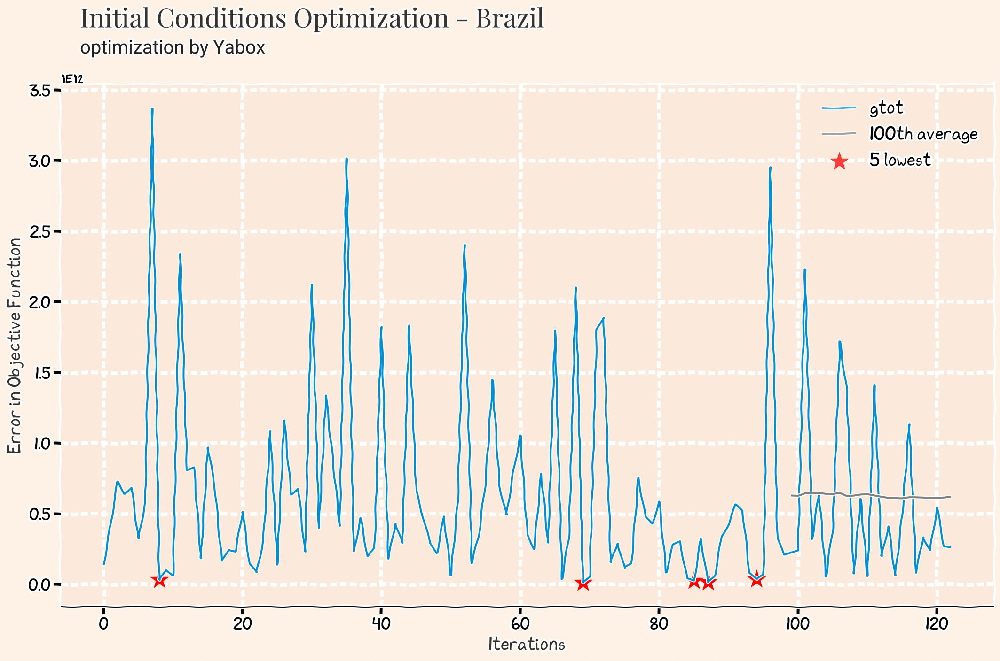

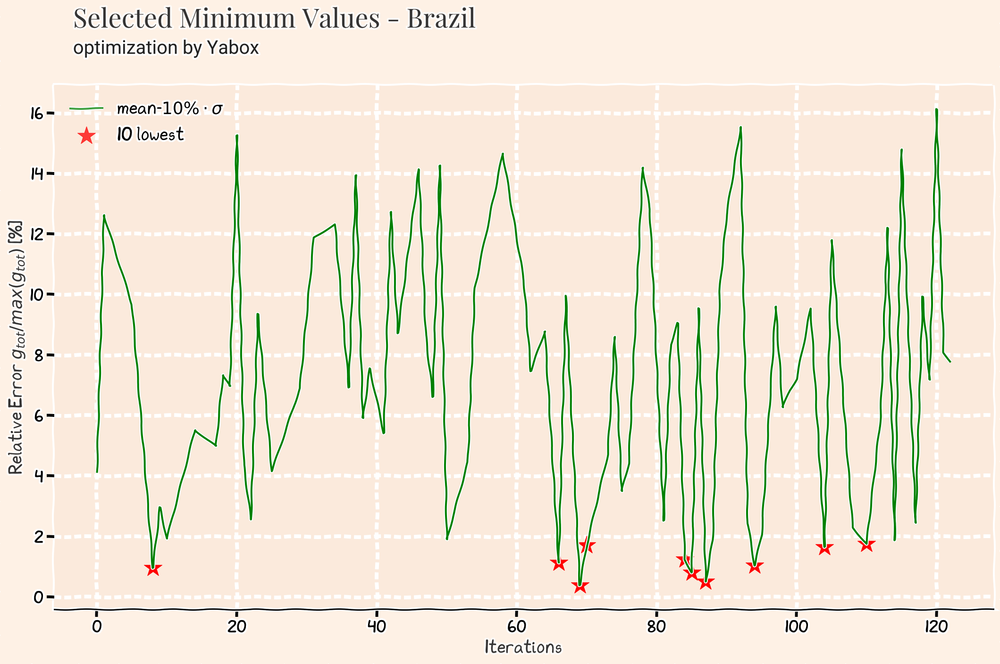

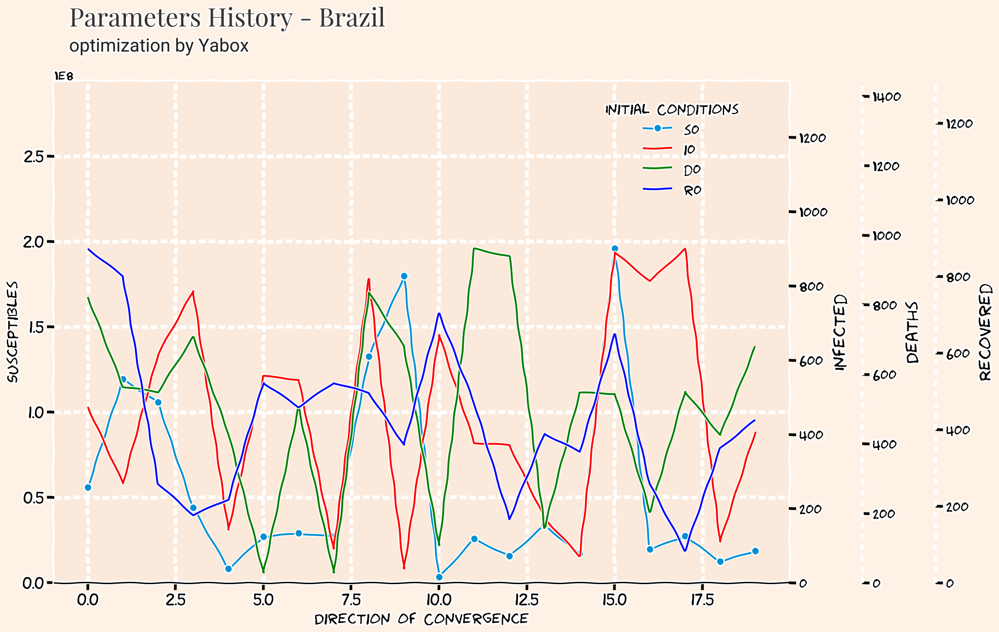

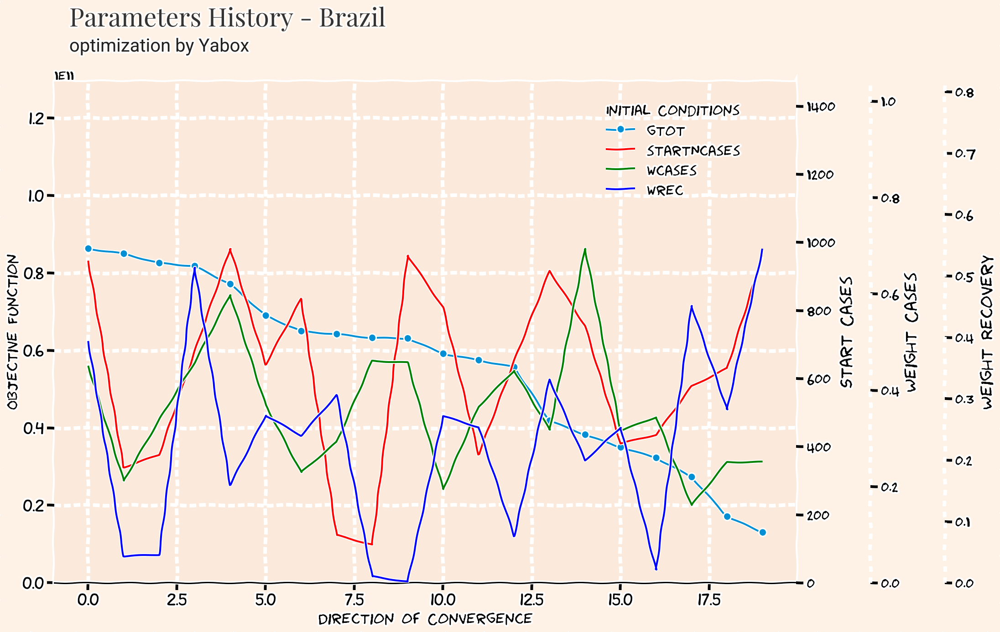

# Results for China

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
139,1.224623e+08,2020-01-30,54,476801391,655,810,689,0.472,0.0627,0.4653


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
139,1.224623e+08,2020-01-30,54,476801391,655,810,689,0.4720,0.0627,0.4653
138,1.329234e+08,2020-01-28,59,180052192,479,308,942,0.1833,0.0318,0.7849
88,1.768700e+08,2020-01-26,213,1149114991,275,447,348,0.2887,0.4604,0.2509
51,1.896903e+08,2020-01-29,12,856865924,25,418,551,0.5750,0.0095,0.4155
107,2.270220e+08,2020-01-28,205,1411164714,514,556,439,0.1344,0.7908,0.0748


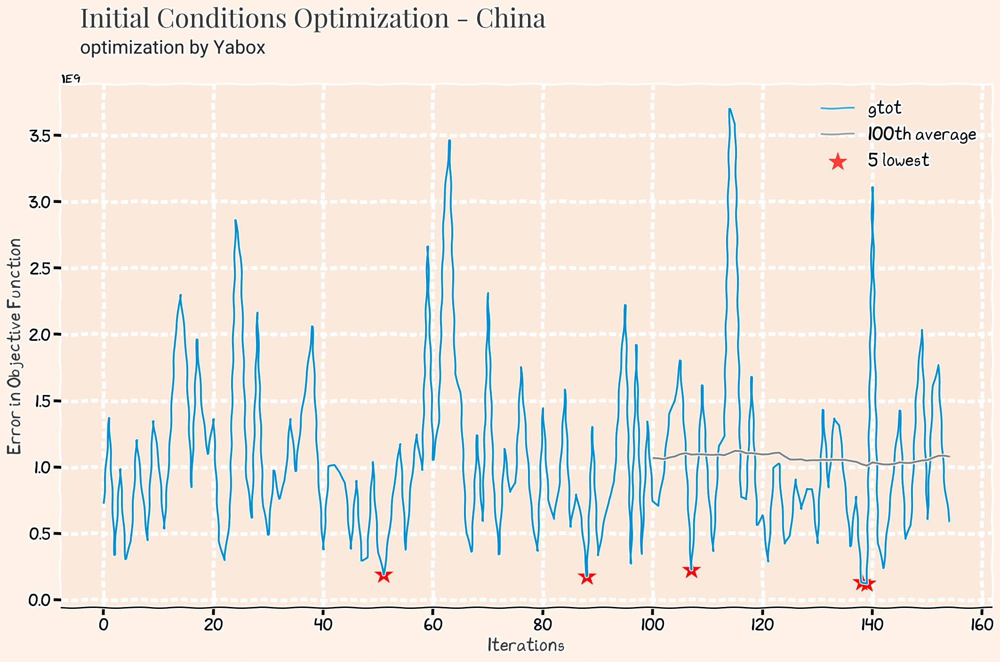

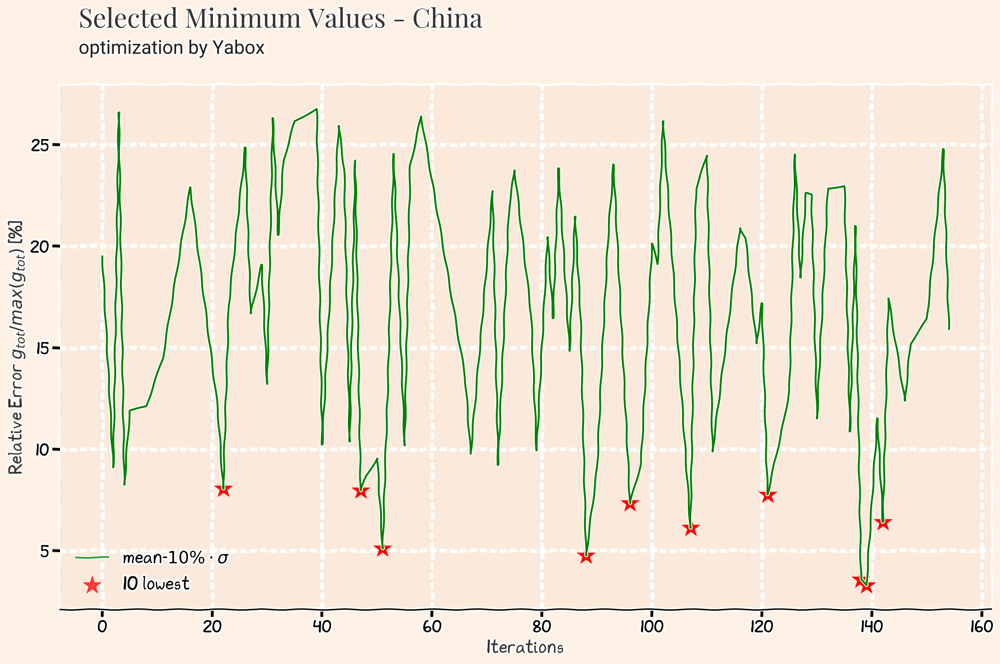

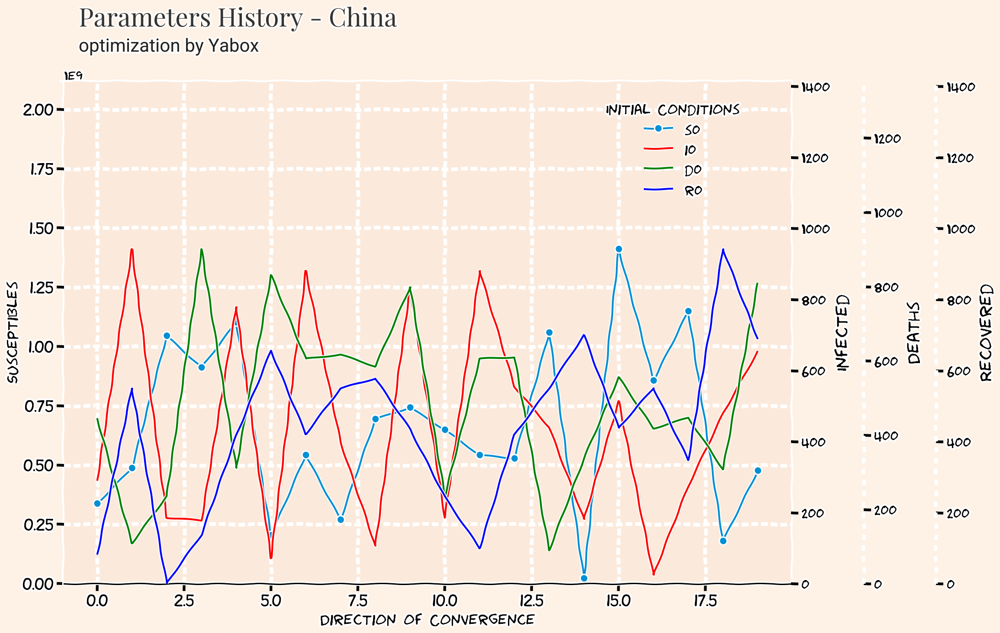

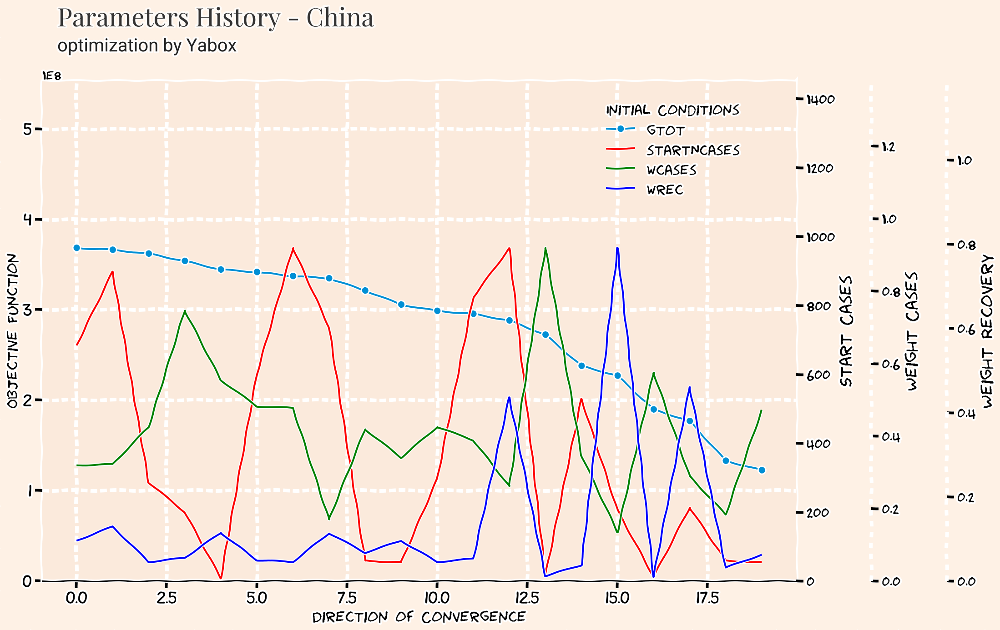

# Results for Italy

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
3,1.281912e+08,2020-03-02,76,2566920,582,482,859,0.0098,0.4055,0.5847


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
3,1.281912e+08,2020-03-02,76,2566920,582,482,859,0.0098,0.4055,0.5847
82,1.896865e+08,2020-02-29,879,4010919,774,668,753,0.0770,0.3764,0.5465
110,2.142845e+08,2020-02-27,712,588402,525,896,344,0.1023,0.5210,0.3767
72,2.281702e+08,2020-03-01,327,18609328,700,31,556,0.1564,0.0454,0.7982
90,2.571799e+08,2020-02-27,529,15120581,256,452,855,0.0261,0.5418,0.4321


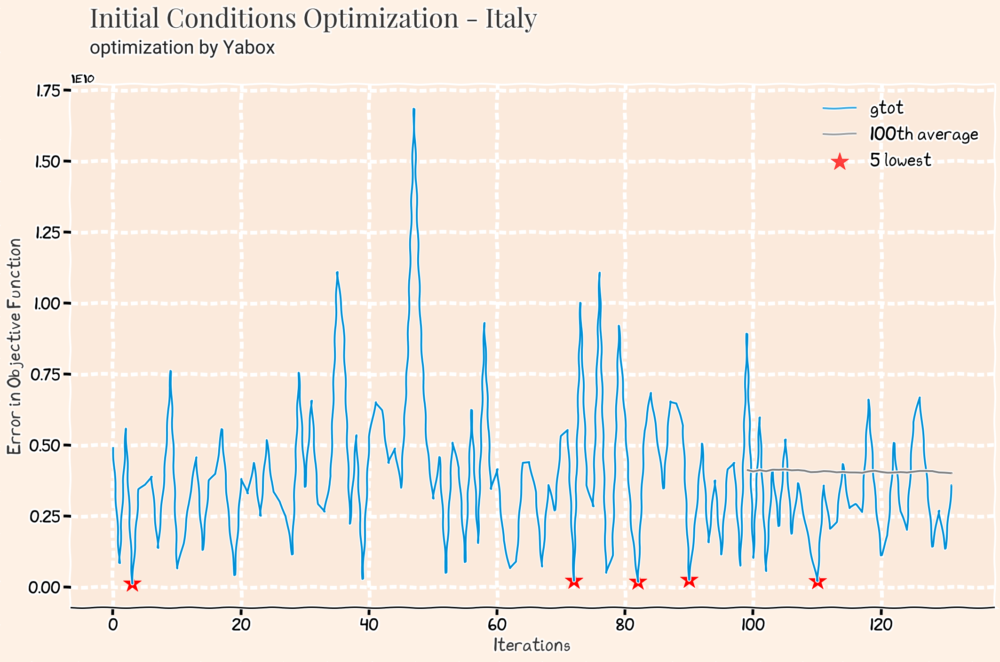

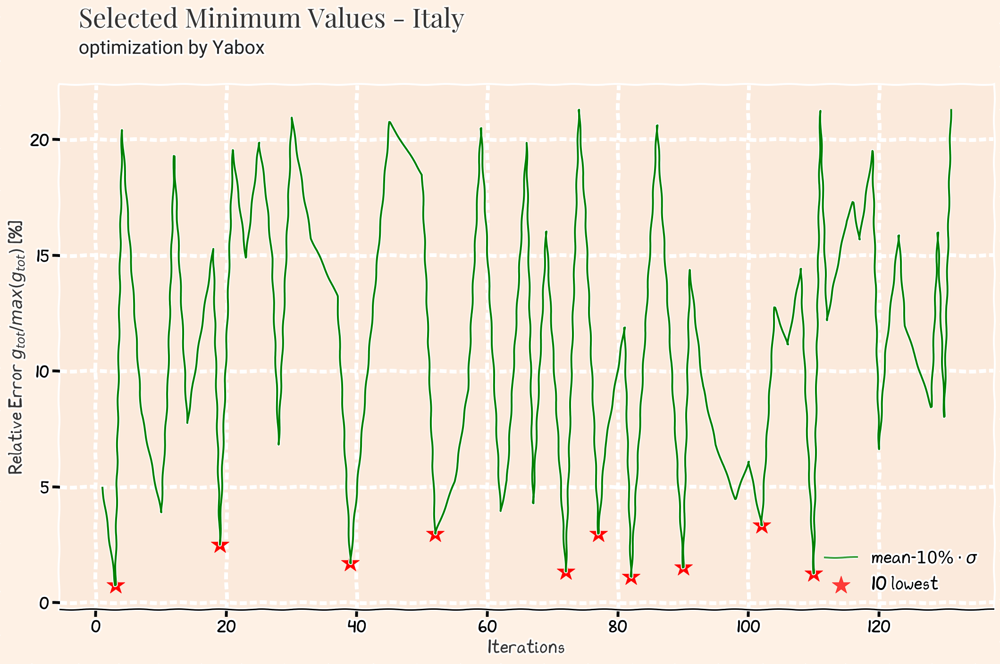

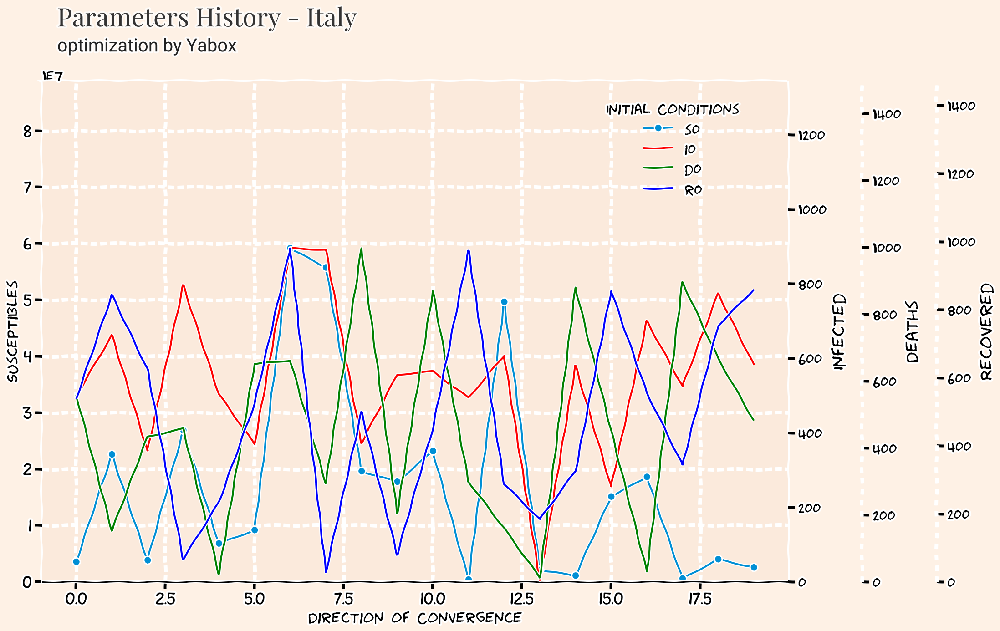

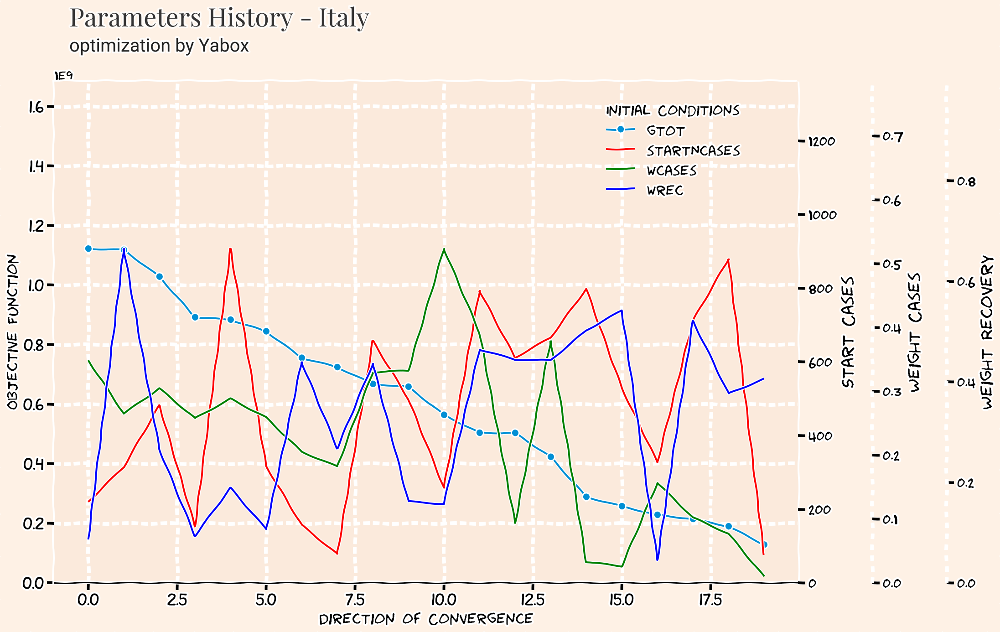

# Results for US

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
27,5.205610e+10,2020-02-18,993,27644216,568,135,221,0.0736,0.5724,0.354


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
27,5.205610e+10,2020-02-18,993,27644216,568,135,221,0.0736,0.5724,0.3540
102,1.503112e+11,2020-02-19,690,28846036,702,79,591,0.3525,0.1679,0.4796
12,1.837640e+11,2020-02-21,690,28846036,103,137,837,0.2764,0.4834,0.2402
139,1.852500e+11,2020-02-18,389,37449671,529,135,697,0.0827,0.4759,0.4414
89,1.901548e+11,2020-02-19,489,9020771,18,237,946,0.2010,0.0680,0.7311


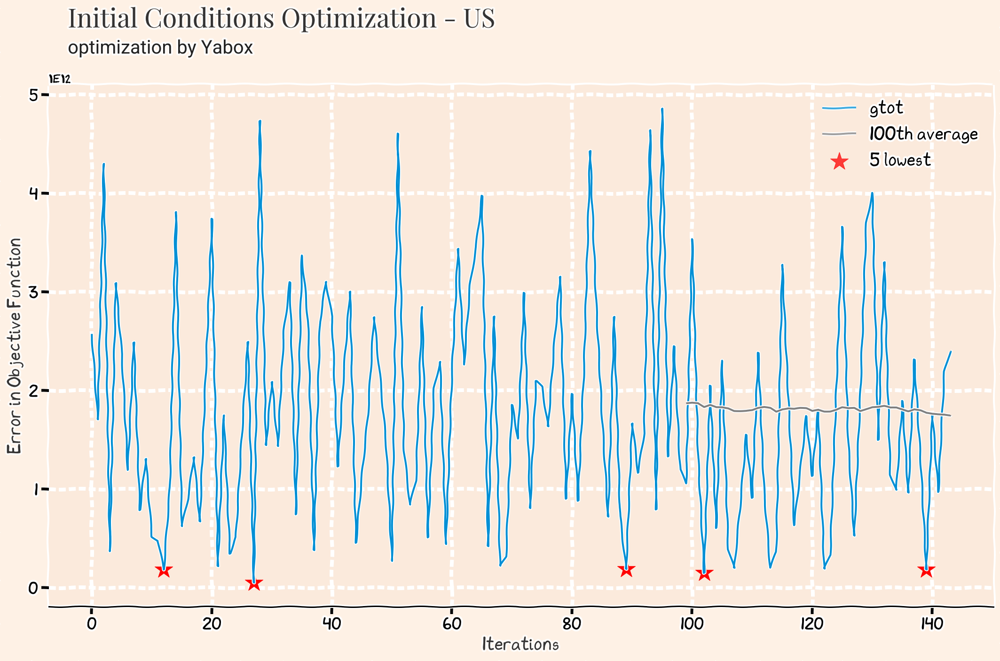

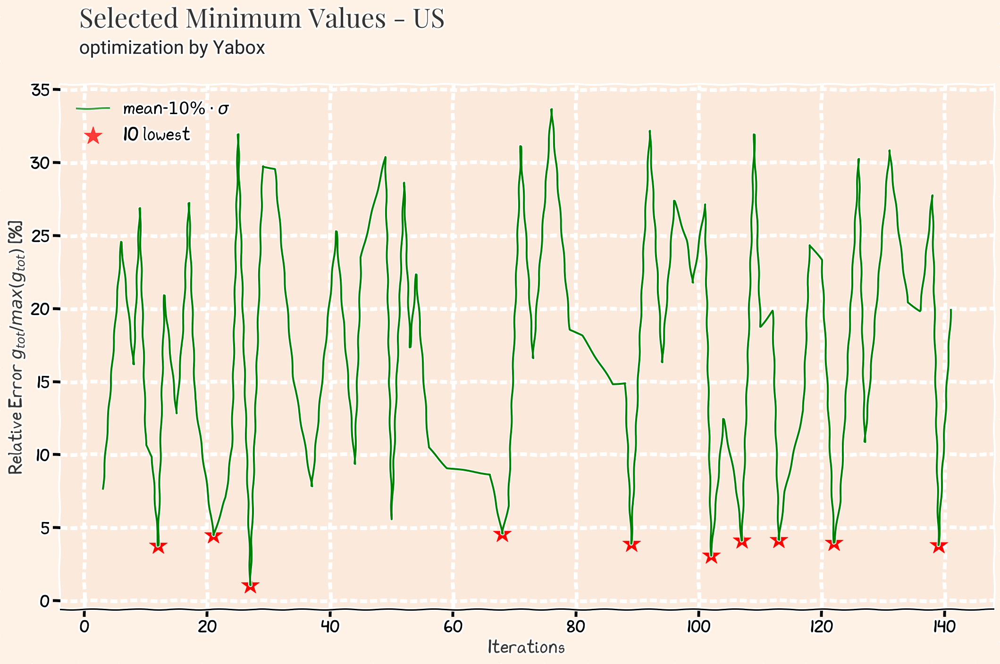

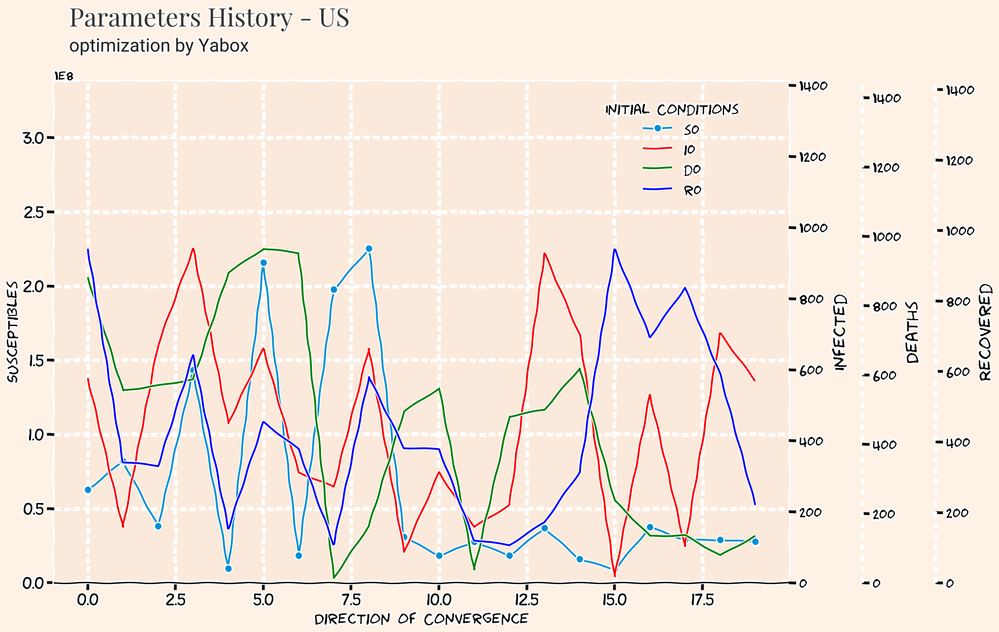

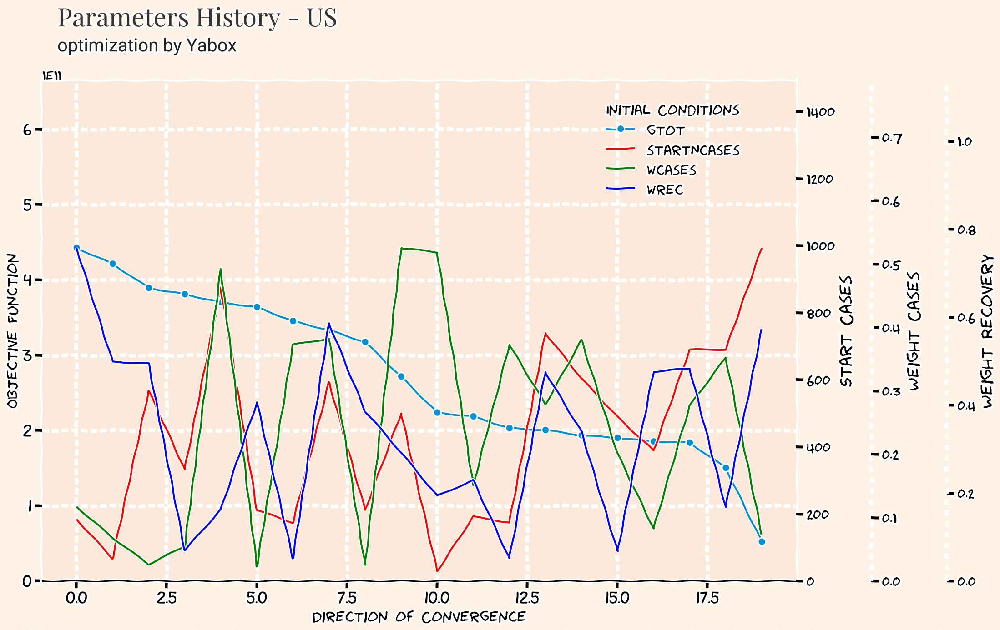

# Results for India

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
41,2.950734e+10,2020-03-08,213,55197214,813,746,794,0.0762,0.8265,0.0974


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,r0,wcases,wrec,wdth
41,2.950734e+10,2020-03-08,213,55197214,813,746,794,0.0762,0.8265,0.0974
147,3.831146e+10,2020-03-14,140,46406593,912,440,735,0.2636,0.4855,0.2510
86,3.882776e+10,2020-03-14,213,55197214,813,284,794,0.1053,0.7600,0.1346
149,4.160425e+10,2020-03-09,401,24496299,495,787,703,0.4326,0.5452,0.0222
14,5.317720e+10,2020-03-13,993,24496299,313,951,532,0.1645,0.1966,0.6388


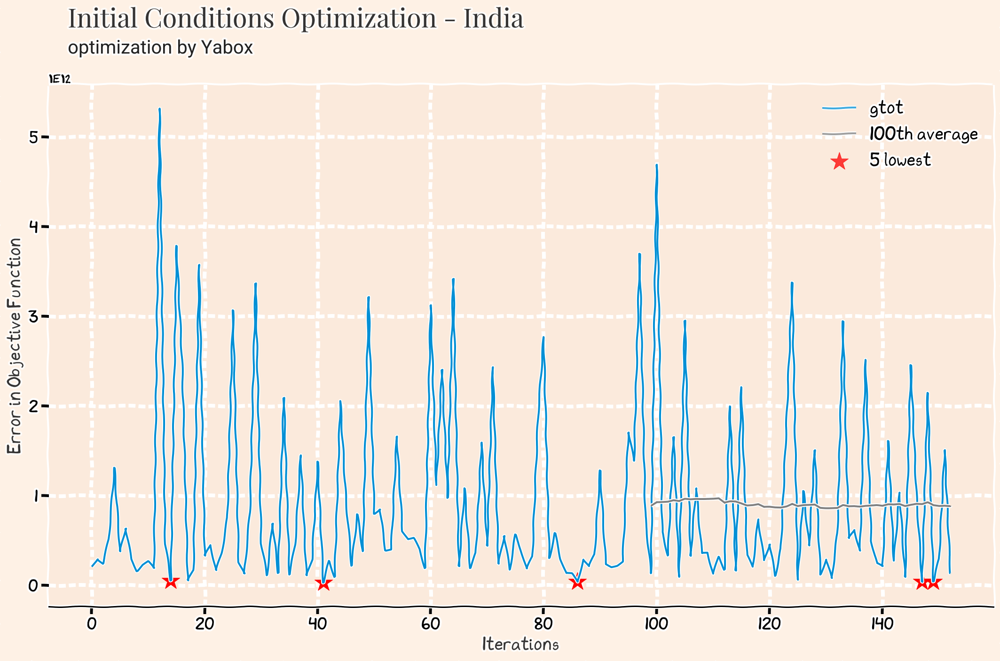

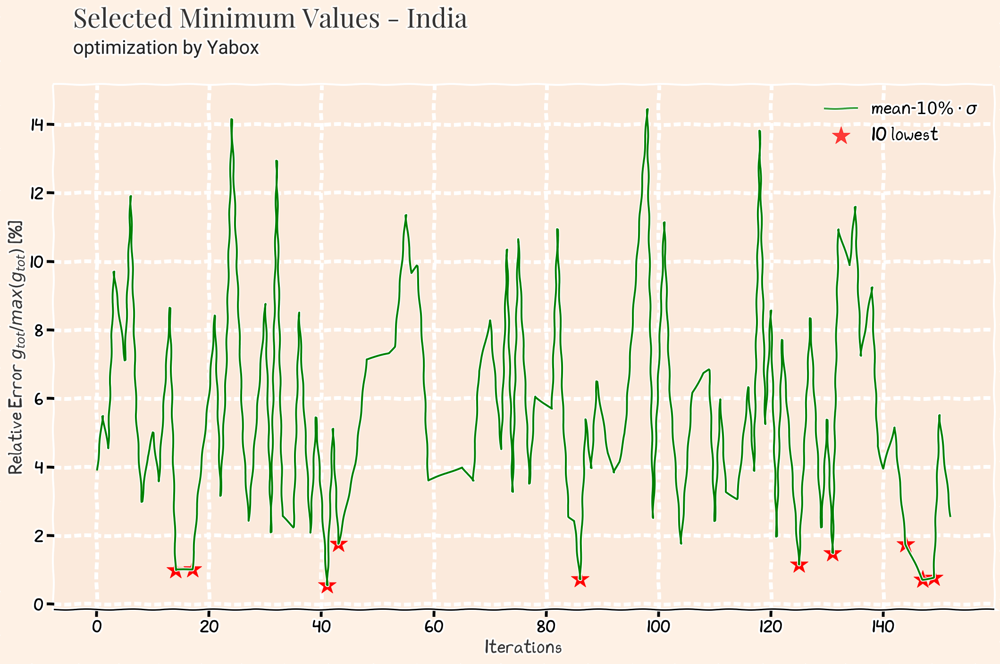

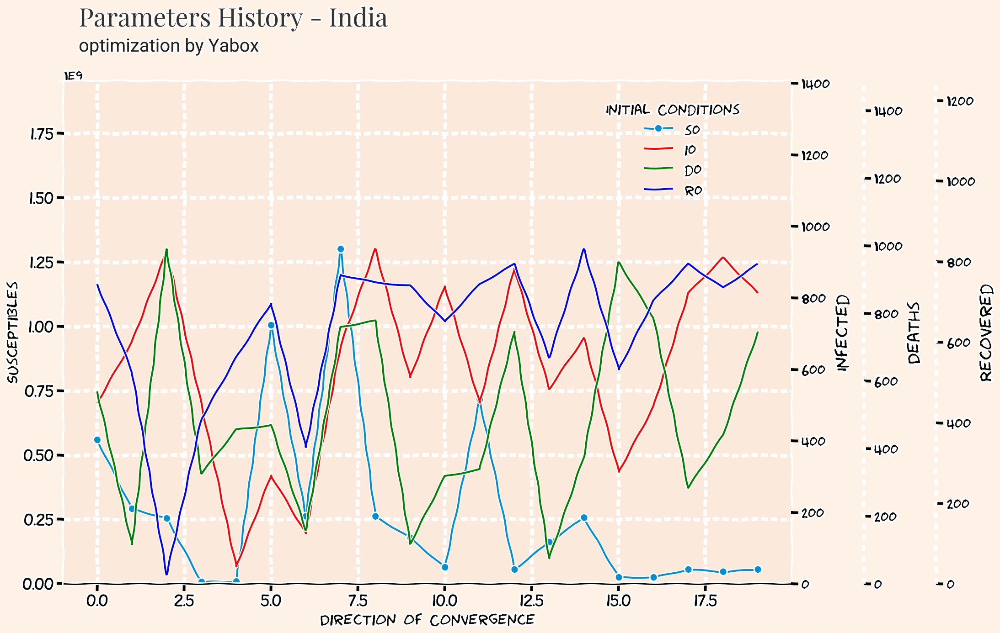

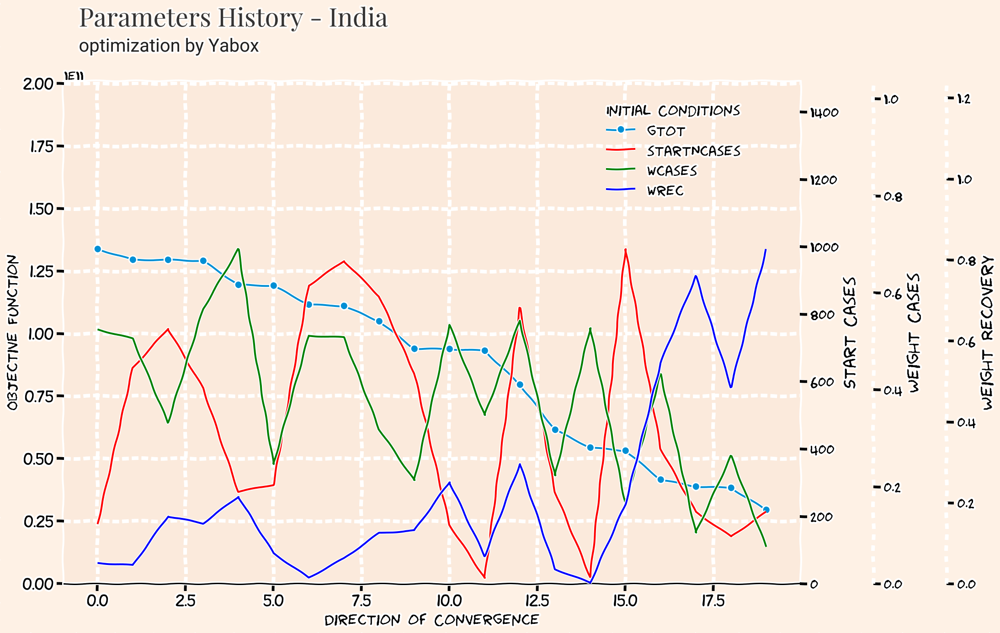

In [14]:
ggtot=[]
for country in countries:
    versionStr=version
    dateparse = lambda x: datetime.strptime(x, ' %m/%d/%y')
    histOptAll= pd.read_table('./results/history_'+country+versionStr+'.csv', sep=",", \
                                index_col=0, header=None, parse_dates=[3], date_parser=dateparse,
        names = ["country","gtot",\
            "s0","startdate","i0","d0","r0","startNcases","wcases","wrec","wdth"])
    histOptAll = histOptAll[['gtot', 'startdate','startNcases','s0',"i0","d0","r0","wcases","wrec","wdth"]]
        
    #clean data
    histOptAll=histOptAll.dropna(how='all')
    histOptAll.gtot=pd.to_numeric(histOptAll.gtot, errors='coerce')
    histOptAll = histOptAll.reset_index(drop=True)
    histOptAll = histOptAll[histOptAll.loc[:,"gtot"]<0.5e14]
    
    #format integers and decimal places
    histOptAll['d0'] = histOptAll['d0'].apply(lambda x: int(x+0.5))
    histOptAll['startNcases'] = histOptAll['startNcases'].apply(lambda x: int(x+0.5))
    histOptAll['s0'] = histOptAll['s0'].apply(lambda x: int(x+0.5))
    histOptAll['i0'] = histOptAll['i0'].apply(lambda x: int(x+0.5))
    histOptAll['r0'] = histOptAll['r0'].apply(lambda x: int(x+0.5))
    histOptAll['wcases'] = histOptAll['wcases'].apply(lambda x: round(x,4))
    histOptAll['wrec'] = histOptAll['wrec'].apply(lambda x: round(x,4))
    histOptAll['wdth'] = histOptAll['wdth'].apply(lambda x: round(x,4))
    
    #print optimum parameters
    histOpt=histOptAll[histOptAll.gtot==min(histOptAll.gtot)]
    histOpt=histOpt.head(1)
    histOpt.to_csv("data/vars_optimized_"+country+model+"HistMin.csv", sep=","
                   , index=False)
        
    #current parameters
    query = dfparam.query('country == "{}"'.format(country)).reset_index()
    parameters = np.array(query.iloc[:, 2:])[0]
    date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,wcases,wrec,wdth = parameters
    
    #query parameters
    j = query['index'].values[0]
    
    #define s0, i0 and d0
    dfparam.at[j, "s0"] = histOpt.s0
    dfparam.at[j, "i0"] = histOpt.i0
    dfparam.at[j, "d0"] = histOpt.d0
    dfparam.at[j, "r0"] = histOpt.r0
    dfparam.at[j, "START"] = histOpt.startNcases

    dfparam['s0'] = dfparam['s0'].astype(int)
    dfparam['a0'] = dfparam['a0'].astype(int)
    dfparam['e0'] = dfparam['e0'].astype(int)
    #define Start N Cases
    dfparam['START'] = dfparam['START'].astype(int)
    #define date, wcases, wrec
    dfparam.at[j, "start-date"] = histOpt.startdate.dt.strftime('%m/%d/%y').values[0]
    dfparam.at[j, "WCASES"] = histOpt.wcases
    dfparam.at[j, "WREC"] = histOpt.wrec
    dfparam.at[j, 'WDTH'] = histOpt.wdth
    
    #save new parameters
    dfparam.to_csv("data/param_optimized_"+model+"_HistMin.csv", sep=",", index=False)    
    
    display(Markdown("# Results for "+country))
    histOpt=calculateWeights(histOpt)    
    display(histOpt.iloc[:,0:10])

    histOptAll=calculateWeights(histOptAll)
    
    #ploty History and get histMin
    histMin=plotHistory(country,model,histOptAll,versionStr)
    
    #initiate ggtot with values
    ggtot.append(histOpt.gtot.values[0])
    
#     #plot params evolution - first set
    plotParams(country,model,histMin,['s0','i0','d0','r0'],['Susceptibles',
                                                'Infected','Deaths','Recovered'],1)
#     #define start date in term of delta days from reference
#     date_str3 = date
#     date_dt3 = datetime.strptime(date_str3,'%m/%d/%y')-timedelta(days = 10)
#     for i in range(0,len(histMin)):
#         histMin.iloc[i,1]=(histMin.iloc[i,1]-date_dt3)/ np.timedelta64(1, 'D')

    #plot params evolution - second set
    plotParams(country,model,histMin,['gtot','startNcases','wcases','wrec'],
               ['Objective Function','Start Cases','Weight Cases','Weight Recovery'],2)

In [15]:
display(Markdown("# Final Results for Initial Conditions"))
display(Markdown("## "+model+" optimization model"))

from IPython.display import HTML

dfparam.columns = map(str.lower, dfparam.columns)
dfparam=calculateWeights(dfparam)
dfparam['gtot_1M'] = pd.Series(ggtot)/1e6
dfparam['gtot_1M'] = dfparam['gtot_1M'].astype(int)

s = dfparam.style.background_gradient(cmap='RdYlGn_r',
            axis=0,subset=['s0','i0','r0','d0','gtot_1M'])
display(s)

# Final Results for Initial Conditions

## Yabox optimization model

,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,start,wcases,wrec,wdth,gtot_1M
0,Brazil,03/02/20,200,18561245,0,0,407,425,680,961,0.250800,0.544100,0.205200,13004
1,China,01/30/20,200,476801391,0,0,200,100,50,50,0.472000,0.062700,0.465300,122
2,Italy,03/02/20,200,2566920,0,0,582,859,482,76,0.009800,0.405500,0.584700,128
3,US,02/18/20,200,27644216,0,0,568,221,135,993,0.073600,0.572400,0.354000,52056
4,India,03/08/20,200,55197214,0,0,813,794,746,213,0.076200,0.826500,0.097400,29507
